In [1]:
import numpy as np
import pandas as pd

data = pd.read_csv(r'C:\Users\lanre\Documents\engine_data.csv')
data.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine Condition
0,700,2.493592,11.790927,3.178981,84.144163,81.632187,1
1,876,2.941606,16.193866,2.464504,77.640934,82.445724,0
2,520,2.961746,6.553147,1.064347,77.752266,79.645777,1
3,473,3.707835,19.510172,3.727455,74.129907,71.774629,1
4,619,5.672919,15.738871,2.052251,78.396989,87.000225,0


In [2]:
data.shape

(19535, 7)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19535 entries, 0 to 19534
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Engine rpm        19535 non-null  int64  
 1   Lub oil pressure  19535 non-null  float64
 2   Fuel pressure     19535 non-null  float64
 3   Coolant pressure  19535 non-null  float64
 4   lub oil temp      19535 non-null  float64
 5   Coolant temp      19535 non-null  float64
 6   Engine Condition  19535 non-null  int64  
dtypes: float64(5), int64(2)
memory usage: 1.0 MB


In [5]:
import numpy as np
import pandas as pd

# Load the dataset
data = pd.read_csv(r'C:\Users\lanre\Documents\engine_data.csv')

# Define functions for data augmentation
def linear_interpolation(data, num_points=10):
    # Interpolate between each pair of consecutive points
    augmented_data = pd.DataFrame()
    for _, row in data.iterrows():
        interpolated_values = np.linspace(row.values[:-1], row.values[1:], num_points, axis=0)
        interpolated_df = pd.DataFrame(interpolated_values, columns=data.columns[:-1])
        interpolated_df['Engine Condition'] = row['Engine Condition']
        augmented_data = pd.concat([augmented_data, interpolated_df])
    return augmented_data

def add_white_noise(data, noise_level=0.05):
    # Add white noise to each feature
    noisy_data = data.copy()
    noisy_data.iloc[:, :-1] += np.random.normal(scale=noise_level, size=noisy_data.iloc[:, :-1].shape)
    return noisy_data

# Perform data augmentation
interpolated_data = linear_interpolation(data)
noisy_data = add_white_noise(data)

# Combine original dataset with augmented datasets
augmented_data = pd.concat([data, interpolated_data, noisy_data])

# Shuffle the augmented dataset
augmented_data = augmented_data.sample(frac=1).reset_index(drop=True)

# Use the augmented dataset for training your model
# For example:
X_train = augmented_data.drop('Engine Condition', axis=1)
y_train = augmented_data['Engine Condition']

In [6]:
augmented_data.shape

(234420, 7)

In [7]:
augmented_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234420 entries, 0 to 234419
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Engine rpm        234420 non-null  float64
 1   Lub oil pressure  234420 non-null  float64
 2   Fuel pressure     234420 non-null  float64
 3   Coolant pressure  234420 non-null  float64
 4   lub oil temp      234420 non-null  float64
 5   Coolant temp      234420 non-null  float64
 6   Engine Condition  234420 non-null  float64
dtypes: float64(7)
memory usage: 12.5 MB


In [8]:
augmented_data.describe(include="all")

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine Condition
count,234420.000000,234420.000000,234420.000000,234420.000000,234420.000000,234420.000000,234420.000000
mean,462.932792,4.700422,4.855462,33.713712,77.970097,46.012020,0.630509
std,327.394406,2.022196,2.465055,26.107464,4.020824,27.232442,0.482668
min,0.003384,-0.046957,-0.091485,-0.060478,61.673325,0.000000,0.000000
25%,199.491062,3.362449,3.140929,8.111627,75.511553,21.623695,0.000000
50%,431.365426,4.388771,4.434743,33.017821,77.323399,47.782496,1.000000
75%,668.267237,5.536278,6.027005,58.008003,80.245135,71.321429,1.000000
max,2239.023900,21.138326,21.154701,89.580796,195.527912,195.527912,1.000000


In [9]:
augmented_data.isnull().sum()


Engine rpm          0
Lub oil pressure    0
Fuel pressure       0
Coolant pressure    0
lub oil temp        0
Coolant temp        0
Engine Condition    0
dtype: int64

In [10]:
augmented_data.duplicated().sum()

19535

In [11]:
augmented_data = augmented_data.drop_duplicates()

In [12]:
augmented_data.shape

(214885, 7)

In [13]:
augmented_data.duplicated().sum()

0

In [14]:
augmented_data['Engine Load'] = (augmented_data['Engine rpm'] + 2 * augmented_data['Lub oil pressure'] + augmented_data['Fuel pressure']) / 4

In [15]:
augmented_data["Engine Stress"] = (augmented_data["Engine rpm"] + augmented_data["Lub oil pressure"] + augmented_data["Fuel pressure"]) / 3

In [16]:
augmented_data["Engine Temperature"] = (augmented_data["lub oil temp"] + augmented_data["Coolant temp"]) / 2

In [17]:
augmented_data["Engine Wear"] = augmented_data["Lub oil pressure"] - augmented_data["Coolant pressure"]

In [18]:
augmented_data["Engine Pressure"] = (augmented_data["Engine rpm"] * augmented_data["Lub oil pressure"] * augmented_data["Fuel pressure"]) / 1000

In [19]:
augmented_data['Engine Efficiency'] = augmented_data['Engine rpm'] / augmented_data['Lub oil pressure']

In [20]:
augmented_data.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine Condition,Engine Load,Engine Stress,Engine Temperature,Engine Wear,Engine Pressure,Engine Efficiency
0,496.484685,4.255658,3.223629,10.236528,78.753694,76.480823,1.0,127.054907,167.987991,77.617259,-5.980870,6.811106,116.664624
1,766.539791,3.286856,6.057310,9.150872,76.167678,68.271154,1.0,194.792703,258.627986,72.219416,-5.864016,15.261428,233.213697
2,280.235807,9.060316,5.186938,52.776232,73.629109,24.428713,1.0,75.885844,98.161020,49.028911,-43.715916,13.169764,30.930027
3,750.459784,2.515908,5.216507,10.581212,74.480975,68.888330,1.0,190.177027,252.730733,71.684653,-8.065304,9.849222,298.285906
4,1131.000000,2.339745,8.950186,2.205944,85.834715,73.450295,0.0,286.157419,380.763311,79.642505,0.133801,23.684446,483.386004


In [21]:
augmented_data.shape

(214885, 13)

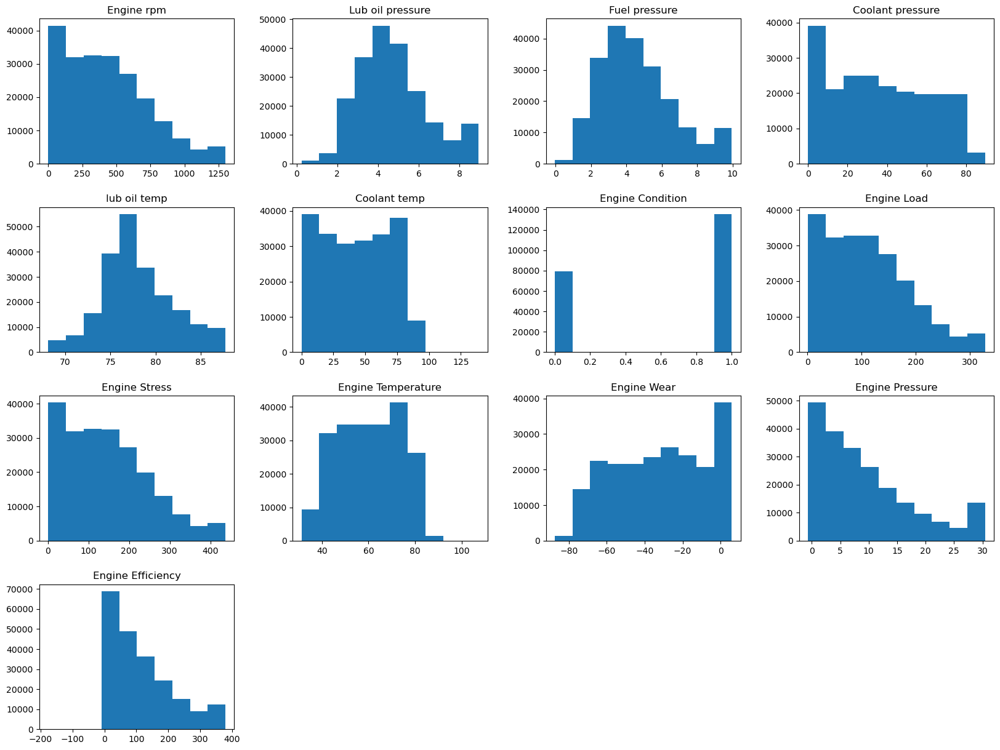

In [45]:
import matplotlib.pyplot as plt

# Plot histograms for all columns in augmented_data
augmented_data.hist(figsize=(20, 15), grid=False)

# Set title
plt.title('Histograms of All Columns')

# Set legend font size to 8
plt.legend(fontsize=9)

# Show the plot
plt.show()

<Axes: xlabel='Engine Condition', ylabel='Engine rpm'>

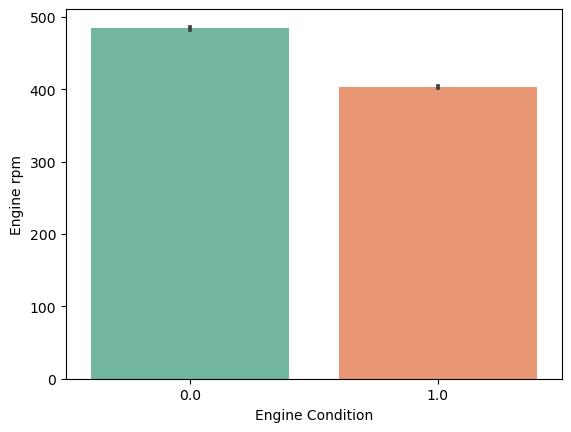

In [43]:
sns.barplot(x="Engine Condition", y="Engine rpm", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Lub oil pressure'>

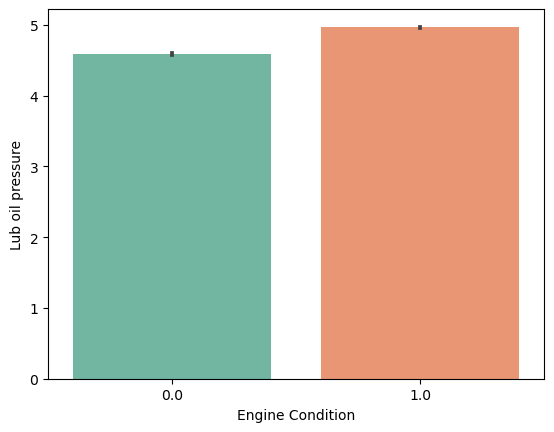

In [44]:
sns.barplot(x="Engine Condition", y="Lub oil pressure", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Fuel pressure'>

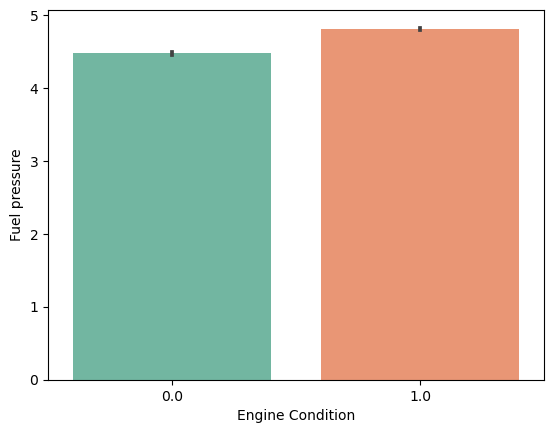

In [45]:
sns.barplot(x="Engine Condition", y="Fuel pressure", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Coolant pressure'>

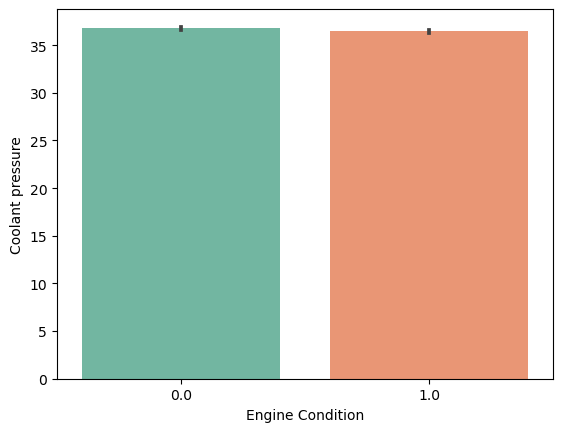

In [47]:

sns.barplot(x="Engine Condition", y="Coolant pressure", data=augmented_data,palette="Set2")



<Axes: xlabel='Engine Condition', ylabel='lub oil temp'>

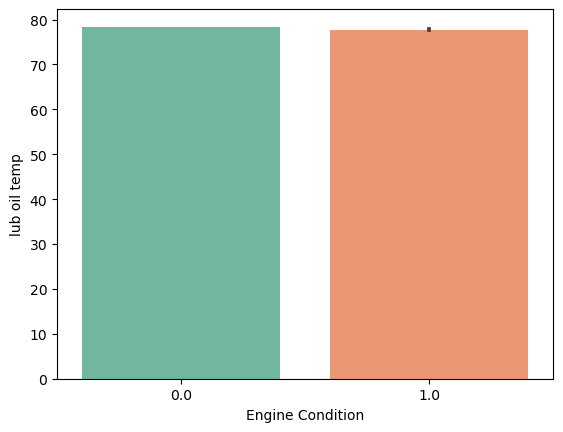

In [49]:
sns.barplot(x="Engine Condition", y="lub oil temp", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Coolant temp'>

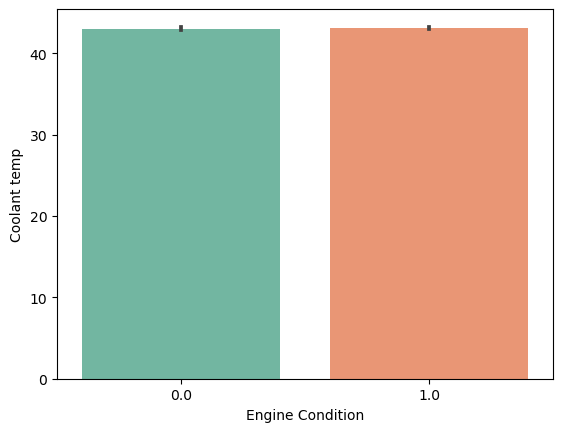

In [50]:
sns.barplot(x="Engine Condition", y="Coolant temp", data=augmented_data,palette="Set2")


<Axes: xlabel='Engine Condition', ylabel='Engine Load'>

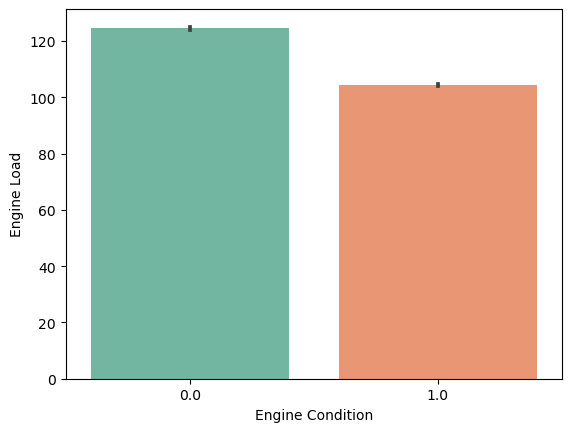

In [52]:
sns.barplot(x="Engine Condition", y="Engine Load", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Engine Stress'>

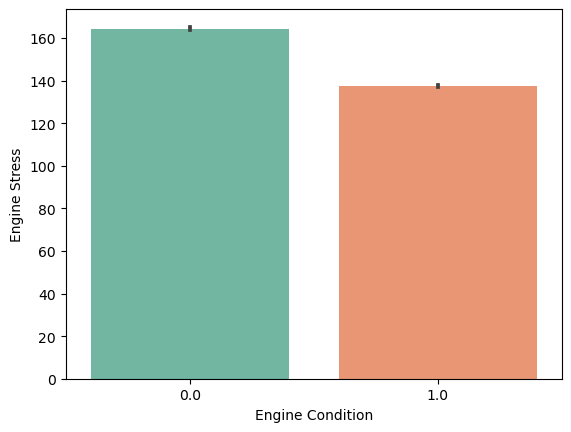

In [53]:

sns.barplot(x="Engine Condition", y="Engine Stress", data=augmented_data,palette="Set2")


<Axes: xlabel='Engine Condition', ylabel='Engine Temperature'>

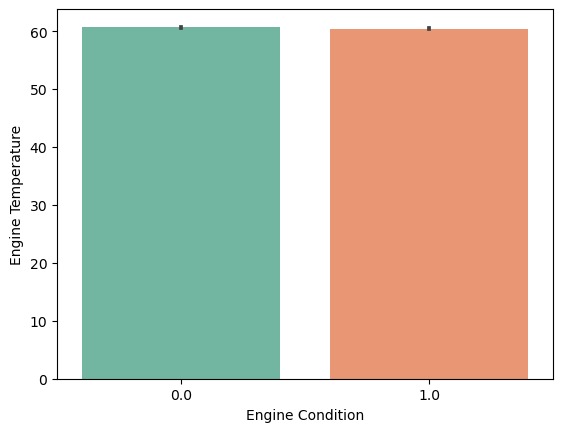

In [54]:
sns.barplot(x="Engine Condition", y="Engine Temperature", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Engine Wear'>

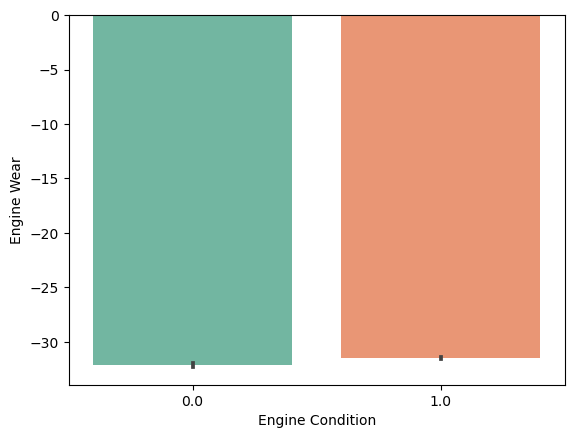

In [55]:
sns.barplot(x="Engine Condition", y="Engine Wear", data=augmented_data,palette="Set2")

<Axes: xlabel='Engine Condition', ylabel='Engine Pressure'>

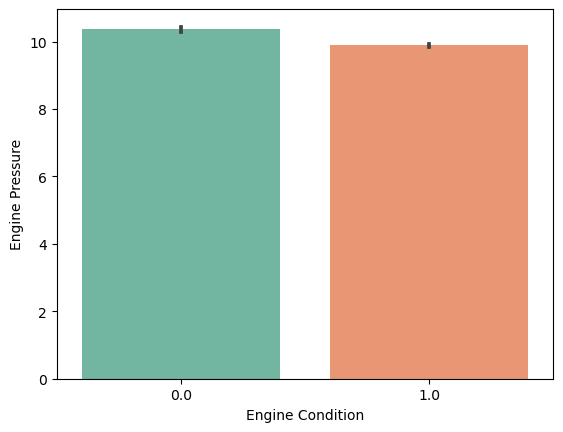

In [56]:
sns.barplot(x="Engine Condition", y="Engine Pressure", data=augmented_data,palette="Set2")

C:\Users\lanre\AppData\Local\Temp\ipykernel_18720\3906407324.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Engine Condition", y="Engine Efficiency", data=augmented_data,palette="Set2",ci=None)


<Axes: xlabel='Engine Condition', ylabel='Engine Efficiency'>

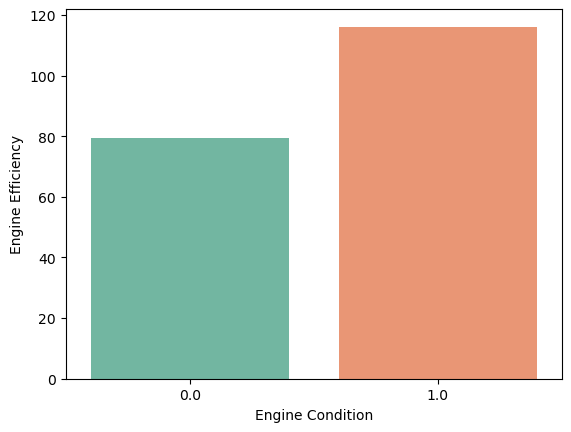

In [57]:
sns.barplot(x="Engine Condition", y="Engine Efficiency", data=augmented_data,palette="Set2",ci=None)

C:\Users\lanre\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x1500 with 0 Axes>

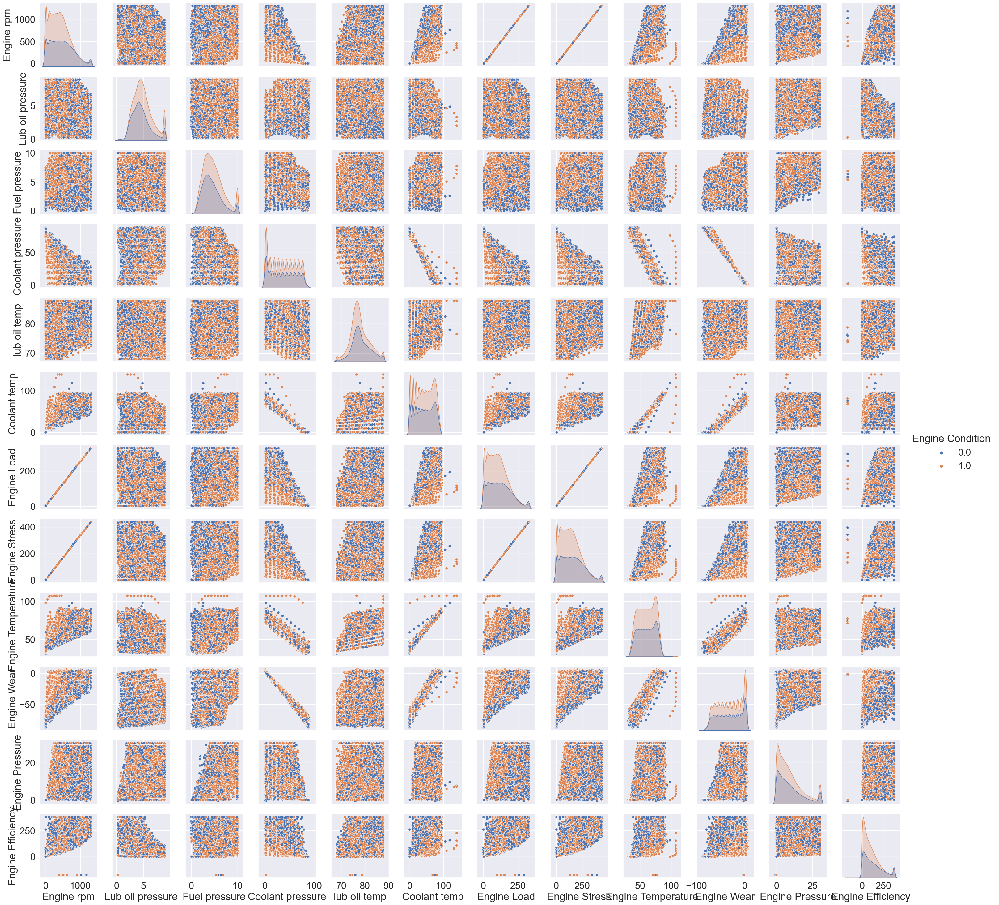

In [46]:
import seaborn as sns

# Set font scale
sns.set(font_scale=2)

# Set figure size
plt.figure(figsize=(20, 15))

# Create pairplot
sns.pairplot(data=augmented_data, hue="Engine Condition")

# Show the plot
plt.show()

In [35]:
correlation = augmented_data.corr()

<Axes: >

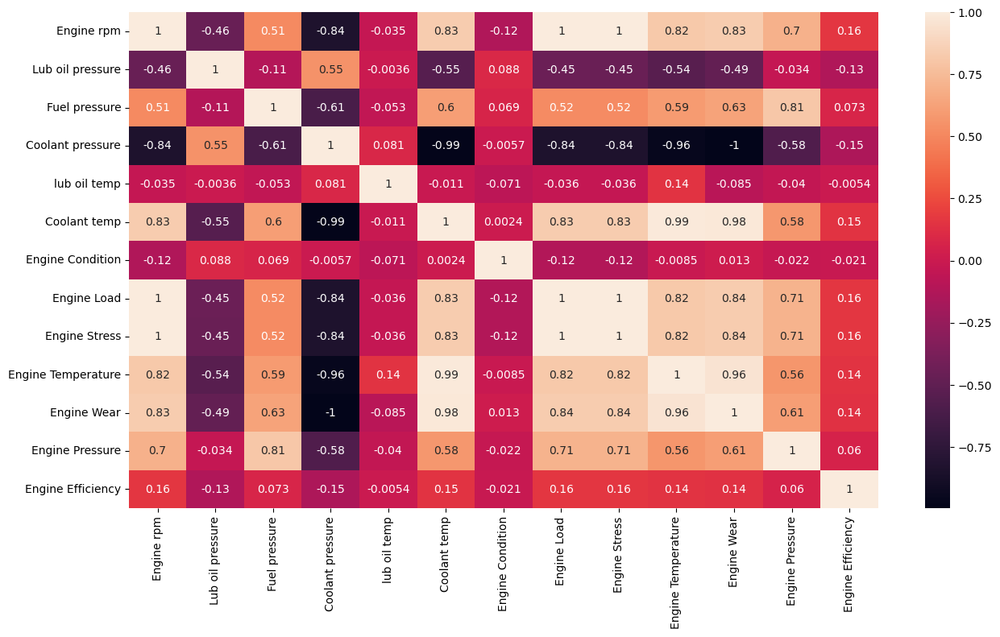

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(15,8))
sns.heatmap(correlation,annot=True)

In [39]:
augmented_data.corr()['Engine Condition']

Engine rpm           -0.123875
Lub oil pressure      0.088029
Fuel pressure         0.069104
Coolant pressure     -0.005746
lub oil temp         -0.070775
Coolant temp          0.002361
Engine Condition      1.000000
Engine Load          -0.122461
Engine Stress        -0.122673
Engine Temperature   -0.008490
Engine Wear           0.013382
Engine Pressure      -0.022241
Engine Efficiency    -0.020850
Name: Engine Condition, dtype: float64

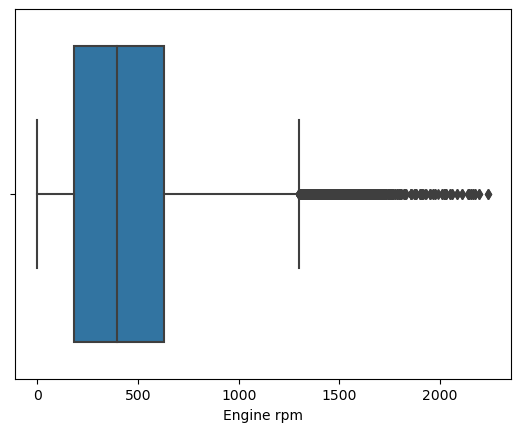

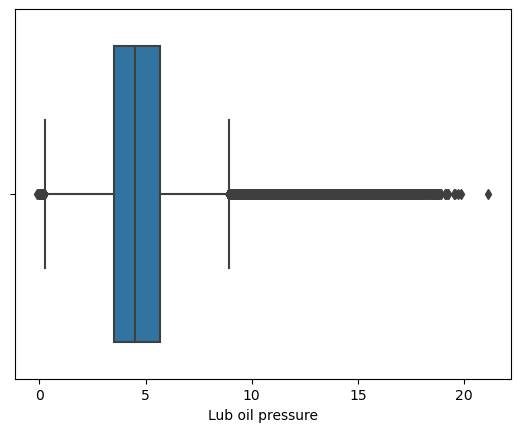

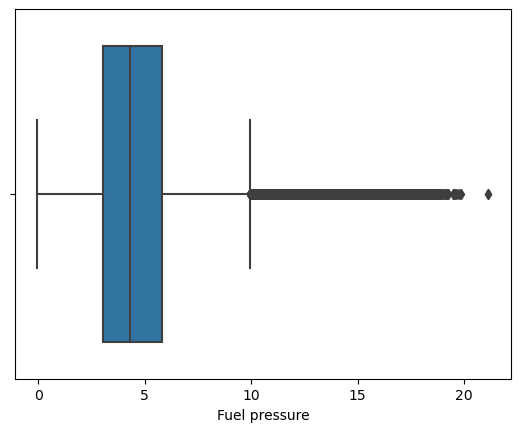

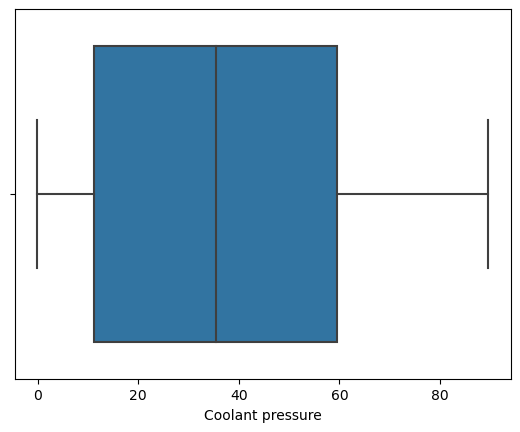

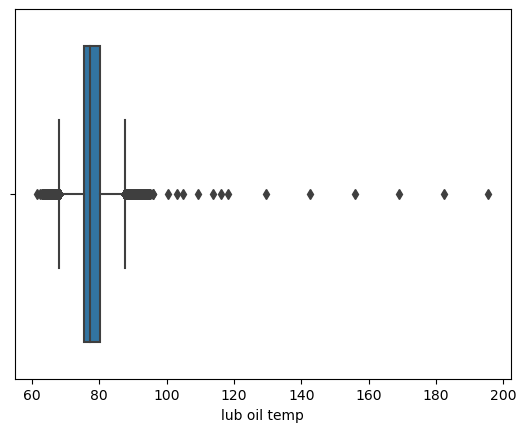

...

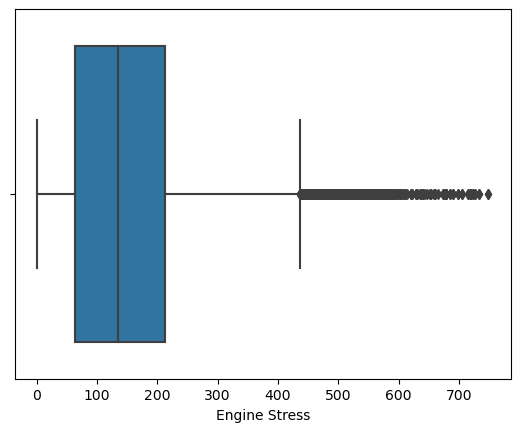

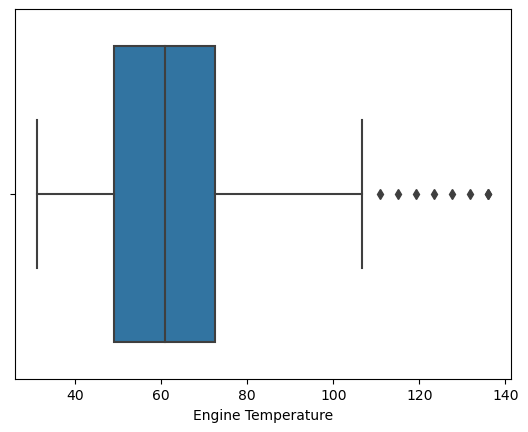

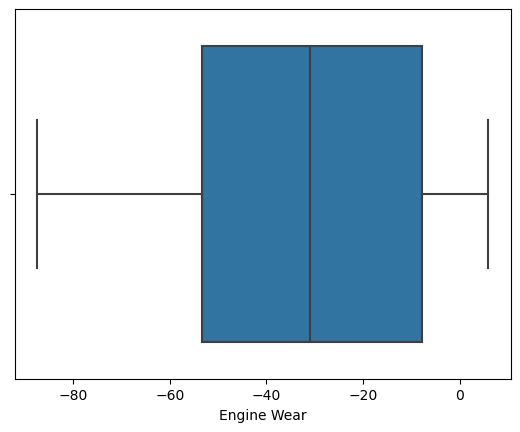

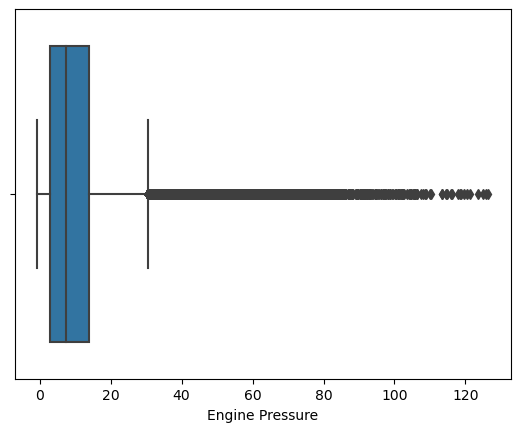

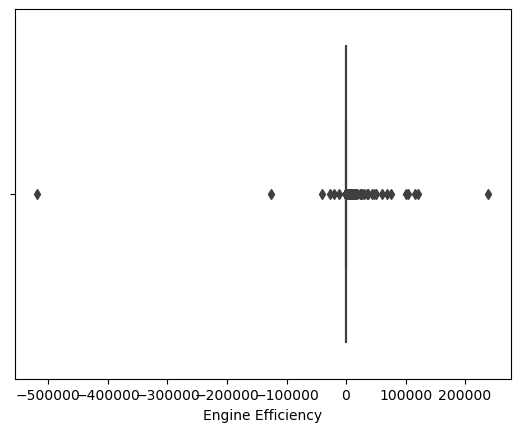

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
# Defining column names
column_names= ["Engine rpm",	"Lub oil pressure",	"Fuel pressure",	"Coolant pressure",	"lub oil temp",	"Coolant temp",
       'Engine Load',	'Engine Stress',	'Engine Temperature',	'Engine Wear',	'Engine Pressure',	'Engine Efficiency']

# Creating boxplots by loop to iterate over each column name
for col in column_names:
    sns.boxplot(x=col, data=augmented_data)
    plt.show()

In [22]:

#  Defining a function to remove outlier

def remove_outliers(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1 # Calculating IQR
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range

In [23]:
for col in  column_names:
    lr, ur = remove_outliers(augmented_data[col])
    augmented_data[col] = np.where(augmented_data[col] > ur, ur, augmented_data[col])
    augmented_data[col] = np.where(augmented_data[col] < lr, lr, augmented_data[col])

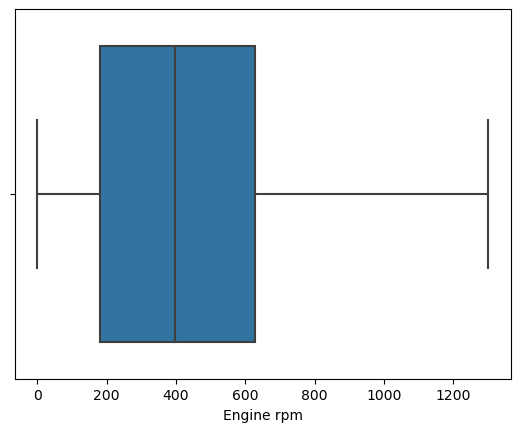

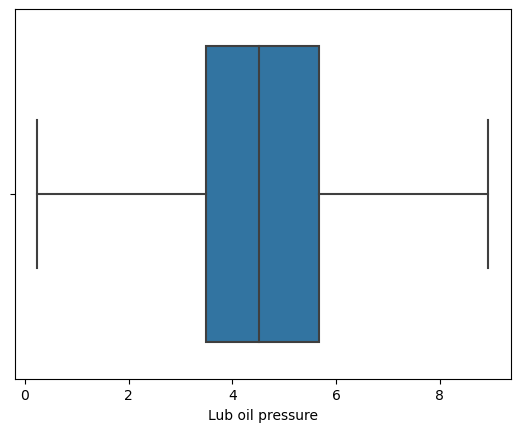

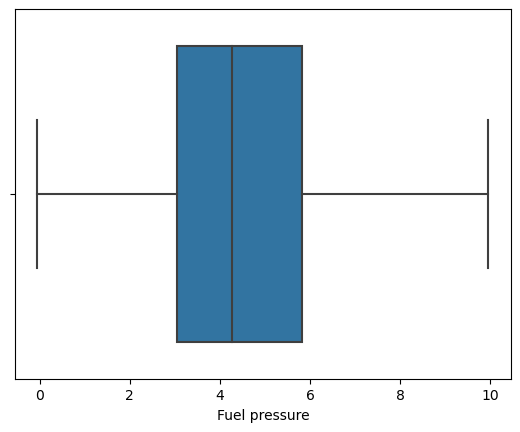

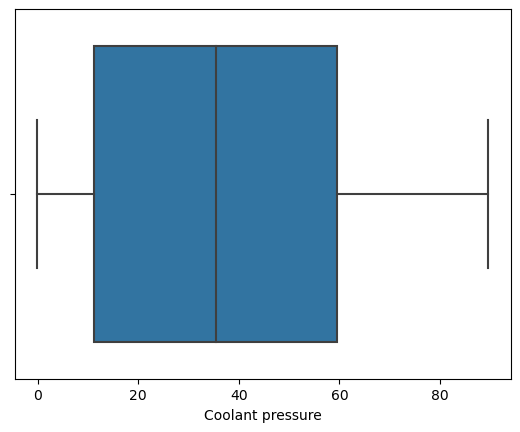

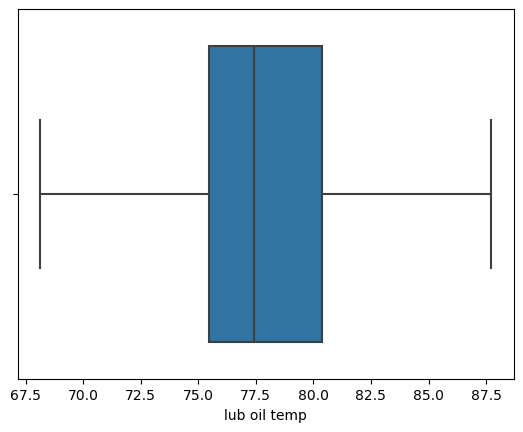

...

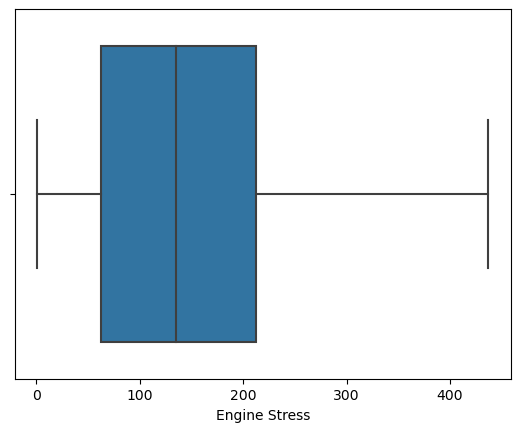

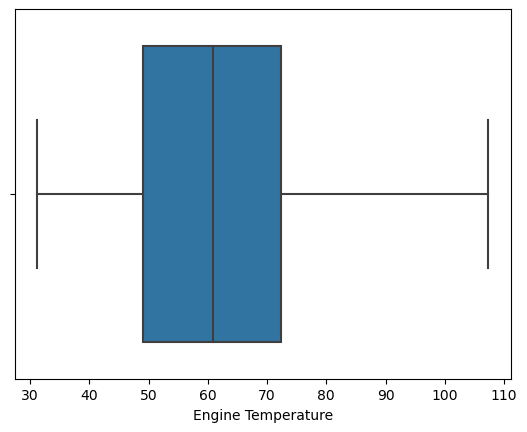

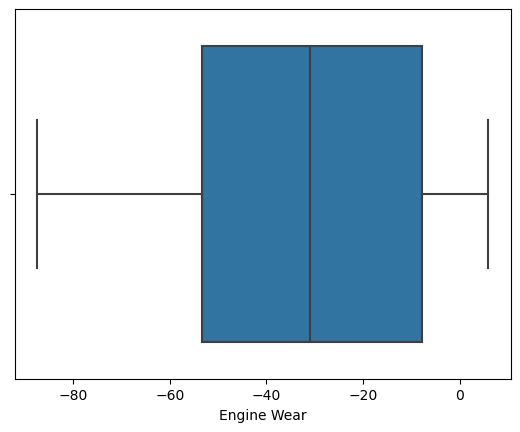

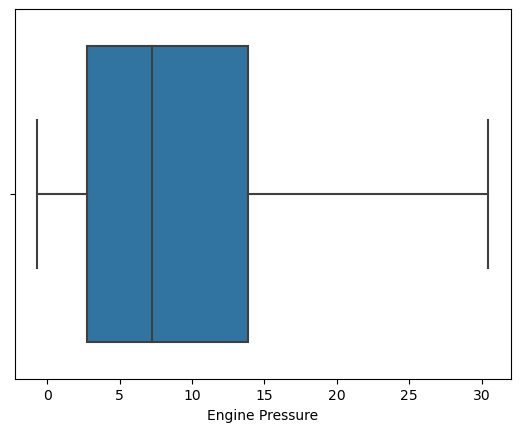

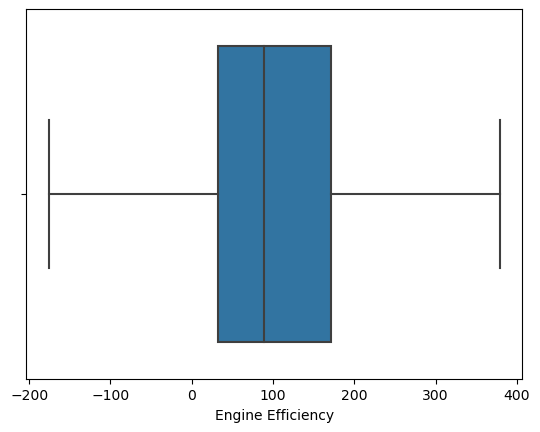

In [24]:
for col in column_names:
    sns.boxplot(x=col, data=augmented_data)
    plt.show()

Engine Condition
1.0    135487
0.0     79398
Name: count, dtype: int64


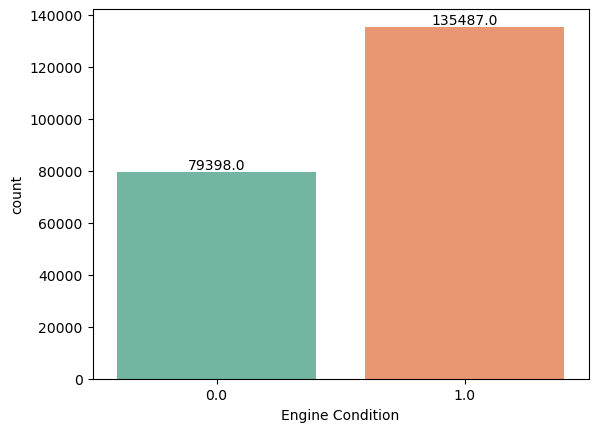

In [25]:

# Get the number of data points in each class

class_counts = augmented_data["Engine Condition"].value_counts()

# Print the class counts

print(class_counts)

sns.countplot(x="Engine Condition", data=augmented_data,palette="Set2")

# Add annotations
ax = plt.gca()
for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width() / 2, p.get_height()), ha="center", va="bottom")

plt.show()

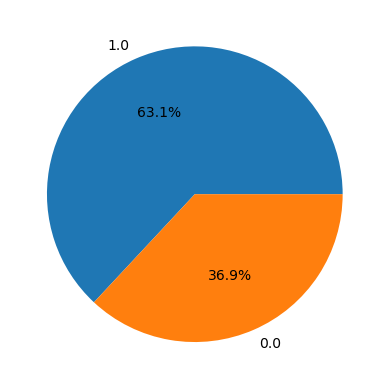

In [26]:
# using the matplotlib library to create a pie chart based on the class distribution of the "Engine Condition"
plt.pie(augmented_data['Engine Condition'].value_counts(),labels=augmented_data['Engine Condition'].value_counts().index,autopct='%1.1f%%');

In [35]:
pip install --upgrade scikit-learn imbalanced-learn


  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/92/e8/86c36e1b13007ca9c89381adac6c078cfc8fb71841a76c08a3fe3eca91d3/imbalanced_learn-0.12.0-py3-none-any.whl.metadata
  Using cached imbalanced_learn-0.12.0-py3-none-any.whl.metadata (8.2 kB)
Using cached imbalanced_learn-0.12.0-py3-none-any.whl (257 kB)
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.10.1
    Uninstalling imbalanced-learn-0.10.1:
      Successfully uninstalled imbalanced-learn-0.10.1


In [38]:
conda install scikit-learn imbalanced-learn

Retrieving notices: ...working... done
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\lanre\anaconda3

  added / updated specs:
    - imbalanced-learn
    - scikit-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2024.3.11  |       haa95532_0         128 KB
    certifi-2024.2.2           |  py311haa95532_0         162 KB
    imbalanced-learn-0.11.0    |  py311haa95532_1         383 KB
    openssl-3.0.13             |       h2bbff1b_0         7.4 MB
    scikit-learn-1.3.0         |  py311hf62ec03_1         8.1 MB
    ------------------------------------------------------------
                                           Total:        16.2 MB

The following packages will be UPDATED:

  ca-certificates                     2023.08.22-haa95532_0 --> 2024.3.11-haa95532_0 
  certifi                         2023.7.22-py311haa95



==> WARNING: A newer version of conda exists. <==
  current version: 23.7.4
  latest version: 24.3.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=24.3.0




In [27]:
# Importing the SMOTE class from the imblearn.over_sampling
from imblearn.over_sampling import SMOTE

#  loaded  dataset into variables x and y
x=augmented_data.drop(['Engine Condition'],axis=1)  # Feature variables
y=augmented_data[['Engine Condition']]  #  Target variable

# Apply SMOTE to the dataset
def apply_smote(x, y):
    smote = SMOTE()
    x_smote, y_smote = smote.fit_resample(x, y)
    return x_smote, y_smote

#  Usage of applying SMOTE fuction
x_smote, y_smote = apply_smote(x, y)


In [28]:

#  creates a new DataFrame called augmented_balanced to contain oversampled data with a balanced class distribution

augmented_balanced = pd.DataFrame(np.column_stack((x_smote, y_smote)), columns=[
    "Engine rpm", "Lub oil pressure", "Fuel pressure", "Coolant pressure", "lub oil temp",
    "Coolant temp", "Engine Load", "Engine Stress", "Engine Temperature", "Engine Wear",
    "Engine Pressure", "Engine Efficiency", "Engine Condition"
])

# Check the class distribution of newly created DataFrame "df_balanced "
class_distribution = augmented_balanced['Engine Condition'].value_counts()
print(class_distribution)

Engine Condition
1.0    135487
0.0    135487
Name: count, dtype: int64


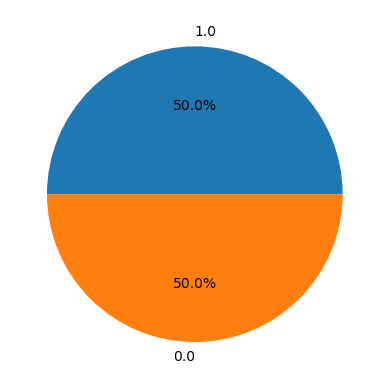

In [29]:
# using the matplotlib library to create a pie chart based on the class distribution of the "Engine Condition"  after balancing the classes

plt.pie(augmented_balanced['Engine Condition'].value_counts(),labels=augmented_balanced['Engine Condition'].value_counts().index,autopct='%1.1f%%');
     

In [30]:
augmented_balanced.shape

(270974, 13)

In [31]:
augmented_balanced.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine Load,Engine Stress,Engine Temperature,Engine Wear,Engine Pressure,Engine Efficiency,Engine Condition
0,102.971543,8.932609,2.741313,66.903614,87.715987,10.879629,32.553617,39.321221,49.574544,-54.652809,3.458124,8.405288,1.0
1,696.000000,2.570920,6.902568,1.127623,84.288404,76.435967,177.011102,235.157829,80.362186,1.443298,12.351183,270.720162,0.0
2,762.937399,4.969382,6.518284,0.929882,77.492967,78.257392,194.848612,258.141689,77.875179,4.039500,24.712953,153.527608,1.0
3,394.117225,3.278842,4.811632,10.796179,76.321593,76.161207,101.371635,134.069233,76.241400,-7.517337,6.217822,120.200116,1.0
4,347.818956,5.920656,9.959272,19.871442,78.069346,61.719102,92.432029,121.269153,69.894224,-13.950786,20.732881,58.746689,1.0


In [32]:
# Importing StandardScaler from scikit-learn preprocessing module.

from sklearn.preprocessing import StandardScaler

In [33]:
# Create an instance of StandardScaler

std_scale=StandardScaler()
std_scale

StandardScaler()

In [34]:

# Defining column names to be scaled

column_names= ["Engine rpm",	"Lub oil pressure",	"Fuel pressure",	"Coolant pressure",	"lub oil temp",	"Coolant temp",
       'Engine Load',	'Engine Stress',	'Engine Temperature',	'Engine Wear',	'Engine Pressure',	'Engine Efficiency']

# Fit and transform the data by loop to iterate over each column name

for col in column_names:
    augmented_balanced[[col]] = std_scale.fit_transform(augmented_balanced[[col]])

In [35]:
 augmented_balanced.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine Load,Engine Stress,Engine Temperature,Engine Wear,Engine Pressure,Engine Efficiency,Engine Condition
0,-1.072182,2.456542,-0.882035,1.191373,2.478196,-1.212113,-1.033044,-1.053504,-0.820531,-0.935844,-0.719973,-1.063024,1.0
1,0.805355,-1.227155,1.125198,-1.393769,1.599821,1.257374,0.800322,0.804655,1.478993,1.362604,0.335264,1.476161,0.0
2,1.017279,0.161660,0.939834,-1.401540,-0.141622,1.325986,1.026705,1.022733,1.293239,1.468979,1.802094,0.341748,1.0
3,-0.150411,-0.817237,0.116609,-1.013773,-0.441806,1.247024,-0.159648,-0.154505,1.171212,0.995456,-0.392511,0.019140,1.0
4,-0.296991,0.712489,2.599637,-0.657095,0.006085,0.702994,-0.273104,-0.275956,0.697143,0.731856,1.329825,-0.575723,1.0


In [36]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Assuming your new augmented dataset without outliers is stored in 'augmented_balanced'
X = augmented_balanced.drop('Engine Condition', axis=1)
y = augmented_balanced['Engine Condition']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshaping y_train and y_test
y_train = np.reshape(y_train.values, (-1, 1))
y_test = np.reshape(y_test.values, (-1, 1))

# Neural Network Models
def build_model(layer_sizes, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(layer_sizes[0], input_shape=(X_train.shape[1],), activation='relu'))
    
    for size in layer_sizes[1:]:
        model.add(Dense(size, activation='relu'))
        model.add(Dropout(dropout_rate))
    
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Model 1: Basic Neural Network
model1 = build_model([16])
# Model 2: Deep Neural Network
model2 = build_model([64, 32, 16])
# Model 3: Larger Deep Neural Network
model3 = build_model([128, 64, 32])

# Training and Evaluating Models
epochs = 10
batch_size = 32
model1_history = model1.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
model2_history = model2.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
model3_history = model3.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

# Evaluating accuracy on the test set
model1_accuracy = model1.evaluate(X_test, y_test, verbose=0)[1]
model2_accuracy = model2.evaluate(X_test, y_test, verbose=0)[1]
model3_accuracy = model3.evaluate(X_test, y_test, verbose=0)[1]

model1_accuracy, model2_accuracy, model3_accuracy

(0.6657440662384033, 0.6978872418403625, 0.6941784024238586)

In [37]:
print(X_train.shape)
print(y_train.shape)

(216779, 12)
(216779, 1)


In [38]:

print(X_test.shape)
print(y_test.shape)

(54195, 12)
(54195, 1)


Epoch 1/100
5420/5420 [==============================] - 72s 13ms/step - loss: 0.6382 - accuracy: 0.6358 - val_loss: 0.6236 - val_accuracy: 0.6545
Epoch 2/100
5420/5420 [==============================] - 58s 11ms/step - loss: 0.6289 - accuracy: 0.6468 - val_loss: 0.6194 - val_accuracy: 0.6466
Epoch 3/100
5420/5420 [==============================] - 62s 11ms/step - loss: 0.6238 - accuracy: 0.6532 - val_loss: 0.6007 - val_accuracy: 0.6790
Epoch 4/100
5420/5420 [==============================] - 64s 12ms/step - loss: 0.6186 - accuracy: 0.6571 - val_loss: 0.6014 - val_accuracy: 0.6816
Epoch 5/100
5420/5420 [==============================] - 62s 11ms/step - loss: 0.6146 - accuracy: 0.6603 - val_loss: 0.5947 - val_accuracy: 0.6821
Epoch 6/100
5420/5420 [==============================] - 63s 12ms/step - loss: 0.6102 - accuracy: 0.6630 - val_loss: 0.5825 - val_accuracy: 0.6842
Epoch 7/100
5420/5420 [==============================] - 58s 11ms/step - loss: 0.6063 - accuracy: 0.6647 - val_loss: 0

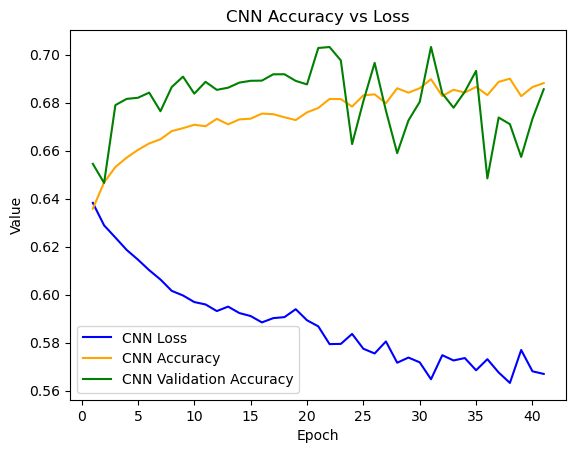

CNN Accuracy: 0.688161313533783
CNN Validation Accuracy: 0.6856259703636169
CNN Precision: 0.7306534735106164
CNN Recall: 0.6562731447193009
CNN F1 Score: 0.691468815232447


In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def build_cnn(input_shape, learning_rate=0.001):
    model = Sequential()
    
    # First Convolutional layer with 32 filters
    model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.2))
    
    # Second Convolutional layer with 64 filters
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model.add(Dropout(0.2))
    
    # Third Convolutional layer with 128 filters
    model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model.add(Dropout(0.2))
    
    # Fourth Convolutional layer with 256 filters
    model.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
    model.add(Dropout(0.2))
    
    # Flatten layer
    model.add(Flatten())
    
    # Dense hidden layer
    model.add(Dense(50, activation='relu'))
    
    # Output layer
    model.add(Dense(1, activation='sigmoid'))
    
    optimizer = Adam(learning_rate=learning_rate)  # Specify learning rate here
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

# Build CNN model with specified learning rate
cnn_model = build_cnn((X_train.shape[1], 1), learning_rate=0.001)

# Set up early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping and validation split
cnn_history = cnn_model.fit(X_train, y_train, validation_split=0.2, callbacks=[early_stop], epochs=100)

# Evaluate the model on the test set
test_loss, test_acc = cnn_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

# Retrieve history containing accuracy, loss, and validation accuracy
cnn_accuracy = cnn_history.history['accuracy']
cnn_loss = cnn_history.history['loss']
cnn_val_accuracy = cnn_history.history['val_accuracy']

# Get predictions for CNN
cnn_predictions = cnn_model.predict(X_test)
cnn_predictions = (cnn_predictions > 0.5).astype(int)

# Calculate evaluation metrics
cnn_precision = precision_score(y_test, cnn_predictions)
cnn_recall = recall_score(y_test, cnn_predictions)
cnn_f1 = f1_score(y_test, cnn_predictions)
cnn_accuracy_val = accuracy_score(y_test, cnn_predictions)

# Plot CNN accuracy against loss
epochs = range(1, len(cnn_accuracy) + 1)
plt.plot(epochs, cnn_loss, label='CNN Loss', color='blue')
plt.plot(epochs, cnn_accuracy, label='CNN Accuracy', color='orange')
plt.plot(epochs, cnn_val_accuracy, label='CNN Validation Accuracy', color='green')
plt.title('CNN Accuracy vs Loss')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

print("CNN Accuracy:", cnn_accuracy[-1])
print("CNN Validation Accuracy:", cnn_val_accuracy[-1])
print("CNN Precision:", cnn_precision)
print("CNN Recall:", cnn_recall)
print("CNN F1 Score:", cnn_f1)

Epoch 1/100
5420/5420 [==============================] - 126s 23ms/step - loss: 0.6581 - accuracy: 0.6010 - val_loss: 0.6322 - val_accuracy: 0.6405
Epoch 2/100
5420/5420 [==============================] - 118s 22ms/step - loss: 0.6330 - accuracy: 0.6434 - val_loss: 0.6207 - val_accuracy: 0.6556
Epoch 3/100
5420/5420 [==============================] - 125s 23ms/step - loss: 0.6186 - accuracy: 0.6584 - val_loss: 0.6206 - val_accuracy: 0.6503
Epoch 4/100
5420/5420 [==============================] - 132s 24ms/step - loss: 0.5989 - accuracy: 0.6711 - val_loss: 0.6142 - val_accuracy: 0.6627
Epoch 5/100
5420/5420 [==============================] - 129s 24ms/step - loss: 0.5857 - accuracy: 0.6775 - val_loss: 0.5704 - val_accuracy: 0.6852
Epoch 6/100
5420/5420 [==============================] - 171s 32ms/step - loss: 0.5710 - accuracy: 0.6872 - val_loss: 0.5483 - val_accuracy: 0.7011
Epoch 7/100
5420/5420 [==============================] - 140s 26ms/step - loss: 0.5571 - accuracy: 0.6935 - val_

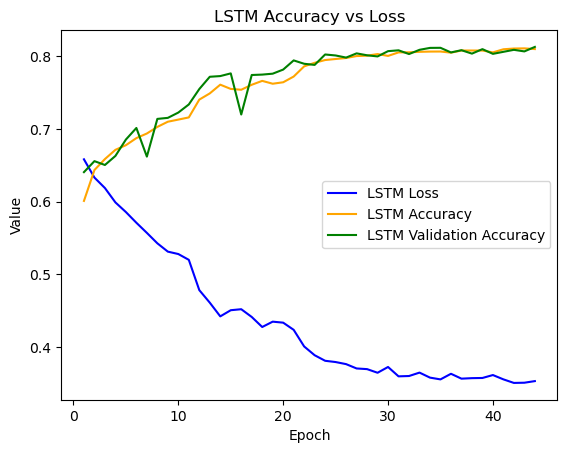

LSTM Accuracy: 0.8094831705093384
LSTM Validation Accuracy: 0.812436580657959
LSTM Precision: 0.8460733405788351
LSTM Recall: 0.7783661679751148
LSTM F1 Score: 0.8108087256736166


In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def build_lstm(input_shape):
    model = Sequential()
    model.add(LSTM(250, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Assuming you have X_train, X_test, y_train, y_test
lstm_model = build_lstm((X_train.shape[1], 1))

# Set up early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping and validation split
lstm_history = lstm_model.fit(X_train, y_train, validation_split=0.2, callbacks=[early_stop], epochs=100)

# Evaluate the model on the test set
test_loss, test_acc = lstm_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

# Retrieve history containing accuracy, loss, and validation accuracy
lstm_accuracy = lstm_history.history['accuracy']
lstm_loss = lstm_history.history['loss']
lstm_val_accuracy = lstm_history.history['val_accuracy']

# Get predictions for LSTM
lstm_predictions = lstm_model.predict(X_test)
lstm_predictions = (lstm_predictions > 0.5).astype(int)

# Calculate evaluation metrics
lstm_precision = precision_score(y_test, lstm_predictions)
lstm_recall = recall_score(y_test, lstm_predictions)
lstm_f1 = f1_score(y_test, lstm_predictions)
lstm_accuracy_val = accuracy_score(y_test, lstm_predictions)

# Plot LSTM accuracy against loss
epochs = range(1, len(lstm_accuracy) + 1)
plt.plot(epochs, lstm_loss, label='LSTM Loss', color='blue')
plt.plot(epochs, lstm_accuracy, label='LSTM Accuracy', color='orange')
plt.plot(epochs, lstm_val_accuracy, label='LSTM Validation Accuracy', color='green')
plt.title('LSTM Accuracy vs Loss')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

print("LSTM Accuracy:", lstm_accuracy[-1])
print("LSTM Validation Accuracy:", lstm_val_accuracy[-1])
print("LSTM Precision:", lstm_precision)
print("LSTM Recall:", lstm_recall)
print("LSTM F1 Score:", lstm_f1)

Epoch 1/100
5420/5420 [==============================] - 49s 9ms/step - loss: 0.6390 - accuracy: 0.6378 - val_loss: 0.6309 - val_accuracy: 0.6434
Epoch 2/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.6273 - accuracy: 0.6524 - val_loss: 0.6062 - val_accuracy: 0.6696
Epoch 3/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.6085 - accuracy: 0.6671 - val_loss: 0.5626 - val_accuracy: 0.6903
Epoch 4/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.5772 - accuracy: 0.6846 - val_loss: 0.6278 - val_accuracy: 0.6521
Epoch 5/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.5899 - accuracy: 0.6758 - val_loss: 0.5648 - val_accuracy: 0.6947
Epoch 6/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.5538 - accuracy: 0.6979 - val_loss: 0.4908 - val_accuracy: 0.7292
Epoch 7/100
5420/5420 [==============================] - 47s 9ms/step - loss: 0.5541 - accuracy: 0.6962 - val_loss: 0.5506 -

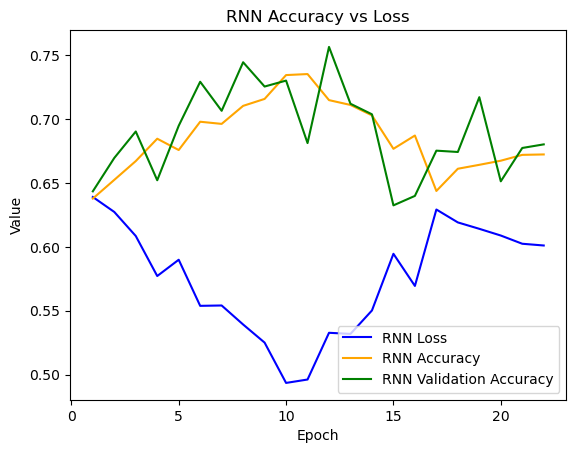

RNN Accuracy: 0.6723041534423828
RNN Validation Accuracy: 0.680182695388794
RNN Precision: 0.805682216766047
RNN Recall: 0.6804917789957043
RNN F1 Score: 0.7378141813217699


In [42]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def build_rnn(input_shape, learning_rate=0.001):
    model = Sequential()
    model.add(SimpleRNN(100, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(150, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(200, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))
    
    optimizer = Adam(learning_rate=learning_rate)  # Specify learning rate here
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Build RNN model with specified learning rate
rnn_model = build_rnn((X_train.shape[1], 1), learning_rate=0.001)

# Set up early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping and validation split
rnn_history = rnn_model.fit(X_train, y_train, validation_split=0.2, callbacks=[early_stop], epochs=100)

# Evaluate the model on the test set
test_loss, test_acc = rnn_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

# Retrieve history containing accuracy, loss, and validation accuracy
rnn_accuracy = rnn_history.history['accuracy']
rnn_loss = rnn_history.history['loss']
rnn_val_accuracy = rnn_history.history['val_accuracy']

# Get predictions for RNN
rnn_predictions = rnn_model.predict(X_test)
rnn_predictions = (rnn_predictions > 0.5).astype(int)

# Calculate evaluation metrics
rnn_precision = precision_score(y_test, rnn_predictions)
rnn_recall = recall_score(y_test, rnn_predictions)
rnn_f1 = f1_score(y_test, rnn_predictions)
rnn_accuracy_val = accuracy_score(y_test, rnn_predictions)

# Plot RNN accuracy against loss
epochs = range(1, len(rnn_accuracy) + 1)
plt.plot(epochs, rnn_loss, label='RNN Loss', color='blue')
plt.plot(epochs, rnn_accuracy, label='RNN Accuracy', color='orange')
plt.plot(epochs, rnn_val_accuracy, label='RNN Validation Accuracy', color='green')
plt.title('RNN Accuracy vs Loss')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

print("RNN Accuracy:", rnn_accuracy[-1])
print("RNN Validation Accuracy:", rnn_val_accuracy[-1])
print("RNN Precision:", rnn_precision)
print("RNN Recall:", rnn_recall)
print("RNN F1 Score:", rnn_f1)

Epoch 1/100
5420/5420 [==============================] - 256s 46ms/step - loss: 0.6707 - accuracy: 0.5783 - val_loss: 0.6402 - val_accuracy: 0.6315
Epoch 2/100
5420/5420 [==============================] - 263s 48ms/step - loss: 0.6428 - accuracy: 0.6325 - val_loss: 0.6349 - val_accuracy: 0.6392
Epoch 3/100
5420/5420 [==============================] - 262s 48ms/step - loss: 0.6307 - accuracy: 0.6463 - val_loss: 0.6077 - val_accuracy: 0.6667
Epoch 4/100
5420/5420 [==============================] - 268s 49ms/step - loss: 0.6145 - accuracy: 0.6617 - val_loss: 0.6078 - val_accuracy: 0.6736
Epoch 5/100
5420/5420 [==============================] - 268s 50ms/step - loss: 0.6052 - accuracy: 0.6656 - val_loss: 0.5758 - val_accuracy: 0.6793
Epoch 6/100
5420/5420 [==============================] - 280s 52ms/step - loss: 0.5954 - accuracy: 0.6699 - val_loss: 0.6212 - val_accuracy: 0.6519
Epoch 7/100
5420/5420 [==============================] - 270s 50ms/step - loss: 0.5877 - accuracy: 0.6744 - val_

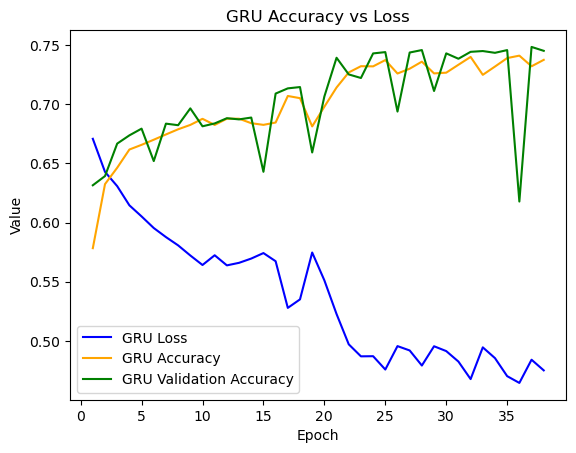

GRU Accuracy: 0.7374166250228882
GRU Validation Accuracy: 0.7450410723686218
GRU Precision: 0.7806542326620074
GRU Recall: 0.6990445859872612
GRU F1 Score: 0.7375989059294716


In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def build_gru(input_shape, learning_rate=0.001):
    model = Sequential()
    
    # First GRU layer with 32 units
    model.add(GRU(32, activation='relu', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    
    # Second GRU layer with 64 units
    model.add(GRU(64, activation='relu', return_sequences=True))
    model.add(Dropout(0.2))
    
    # Third GRU layer with 128 units
    model.add(GRU(128, activation='relu', return_sequences=True))
    model.add(Dropout(0.2))
    
    # Fourth GRU layer with 256 units
    model.add(GRU(256, activation='relu'))
    model.add(Dropout(0.2))
    
    # Dense output layer
    model.add(Dense(1, activation='sigmoid'))
    
    optimizer = Adam(learning_rate=learning_rate)  # Specify learning rate here
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

# Build GRU model with specified learning rate
gru_model = build_gru((X_train.shape[1], 1), learning_rate=0.001)

# Set up early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping and validation split
gru_history = gru_model.fit(X_train, y_train, validation_split=0.2, callbacks=[early_stop], epochs=100)

# Evaluate the model on the test set
test_loss, test_acc = gru_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

# Retrieve history containing accuracy, loss, and validation accuracy
gru_accuracy = gru_history.history['accuracy']
gru_loss = gru_history.history['loss']
gru_val_accuracy = gru_history.history['val_accuracy']

# Get predictions for GRU
gru_predictions = gru_model.predict(X_test)
gru_predictions = (gru_predictions > 0.5).astype(int)

# Calculate evaluation metrics
gru_precision = precision_score(y_test, gru_predictions)
gru_recall = recall_score(y_test, gru_predictions)
gru_f1 = f1_score(y_test, gru_predictions)
gru_accuracy_val = accuracy_score(y_test, gru_predictions)

# Plot GRU accuracy against loss
epochs = range(1, len(gru_accuracy) + 1)
plt.plot(epochs, gru_loss, label='GRU Loss', color='blue')
plt.plot(epochs, gru_accuracy, label='GRU Accuracy', color='orange')
plt.plot(epochs, gru_val_accuracy, label='GRU Validation Accuracy', color='green')
plt.title('GRU Accuracy vs Loss')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

print("GRU Accuracy:", gru_accuracy[-1])
print("GRU Validation Accuracy:", gru_val_accuracy[-1])
print("GRU Precision:", gru_precision)
print("GRU Recall:", gru_recall)
print("GRU F1 Score:", gru_f1)

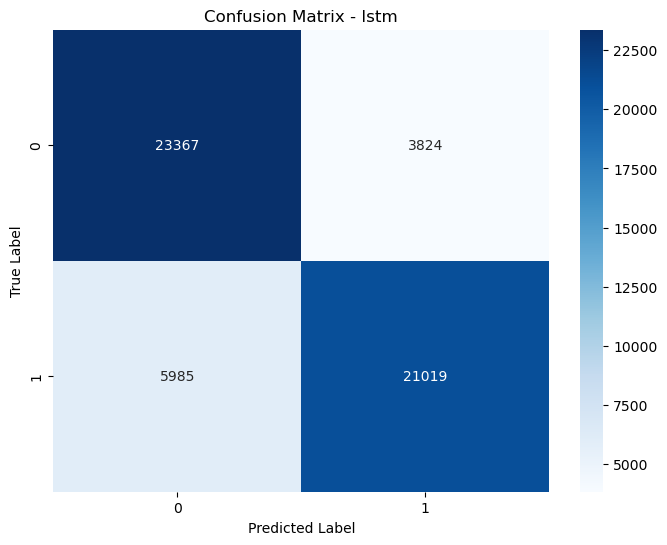

In [45]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix for lstm
lstm_conf_matrix = confusion_matrix(y_test, lstm_predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(lstm_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - lstm')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

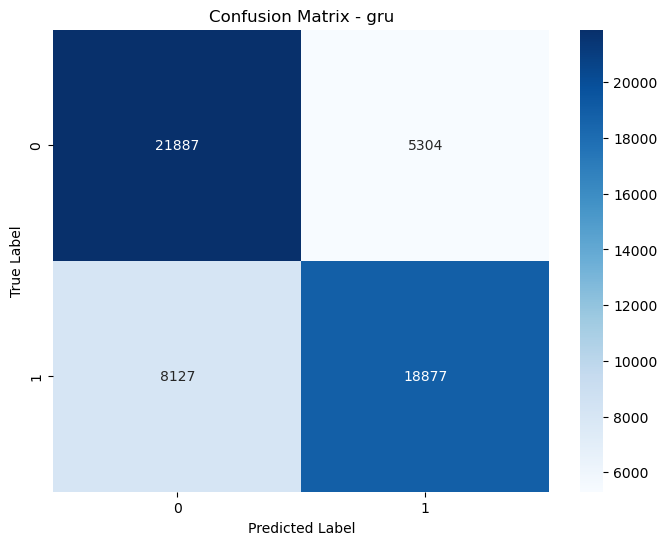

In [46]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix for lstm
gru_conf_matrix = confusion_matrix(y_test, gru_predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(gru_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - gru')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

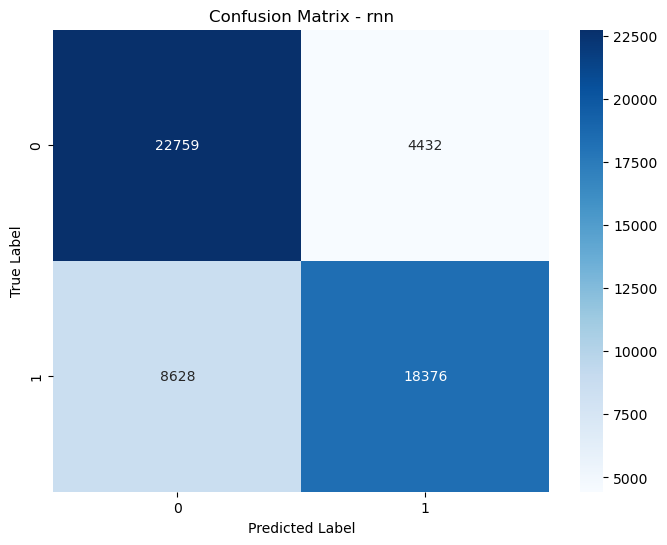

In [47]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix for lstm
rnn_conf_matrix = confusion_matrix(y_test, rnn_predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(rnn_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - rnn')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

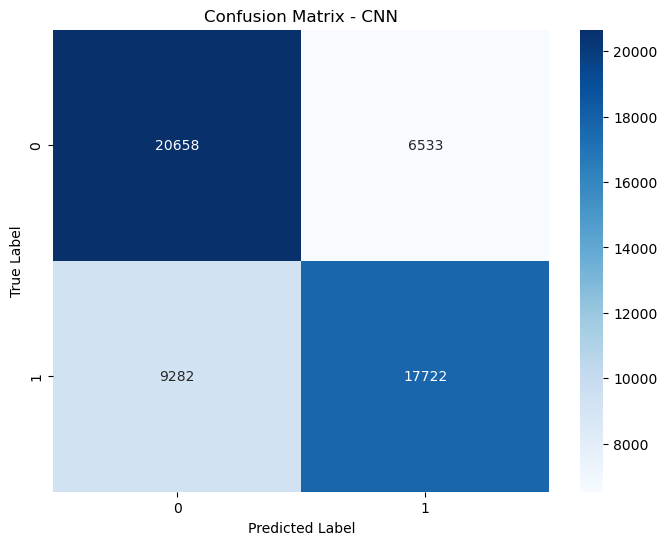

In [48]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix for CNN
cnn_conf_matrix = confusion_matrix(y_test, cnn_predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cnn_conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - CNN')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

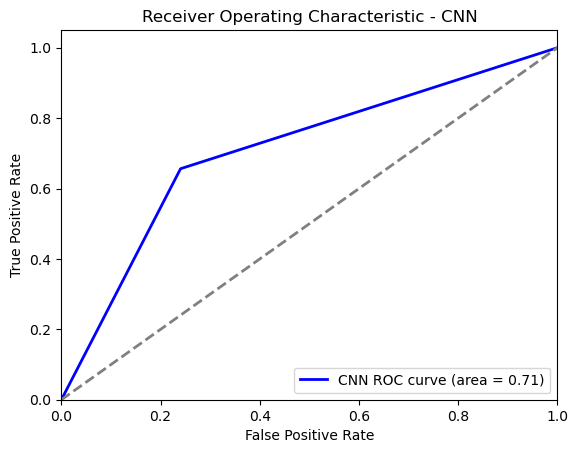

In [49]:
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for CNN
cnn_fpr, cnn_tpr, cnn_thresholds = roc_curve(y_test, cnn_predictions)
cnn_auc = auc(cnn_fpr, cnn_tpr)

# Plot ROC curve
plt.plot(cnn_fpr, cnn_tpr, color='blue', lw=2, label='CNN ROC curve (area = %0.2f)' % cnn_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - CNN')
plt.legend(loc='lower right')
plt.show()

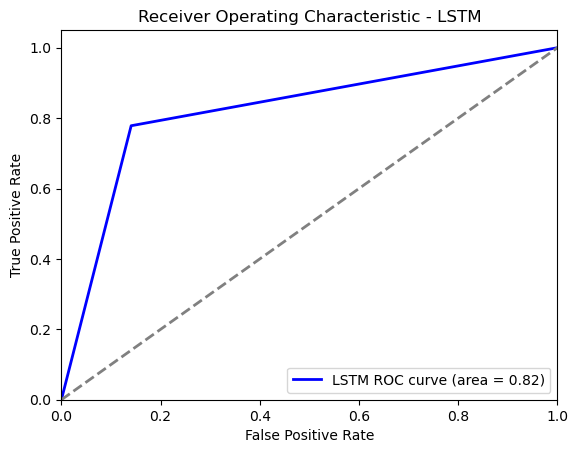

In [50]:
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for lstm
lstm_fpr, lstm_tpr, lstm_thresholds = roc_curve(y_test, lstm_predictions)
lstm_auc = auc(lstm_fpr, lstm_tpr)

# Plot ROC curve
plt.plot(lstm_fpr, lstm_tpr, color='blue', lw=2, label='LSTM ROC curve (area = %0.2f)' % lstm_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - LSTM')
plt.legend(loc='lower right')
plt.show()

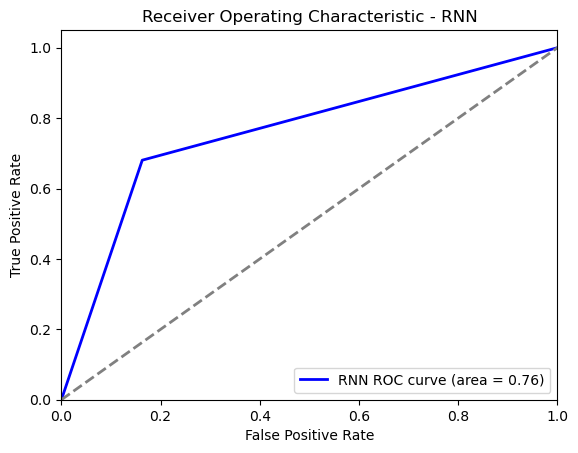

In [53]:
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for lstm
rnn_fpr, rnn_tpr, rnn_thresholds = roc_curve(y_test, rnn_predictions)
rnn_auc = auc(rnn_fpr, rnn_tpr)

# Plot ROC curve
plt.plot(rnn_fpr, rnn_tpr, color='blue', lw=2, label='RNN ROC curve (area = %0.2f)' % rnn_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - RNN')
plt.legend(loc='lower right')
plt.show()

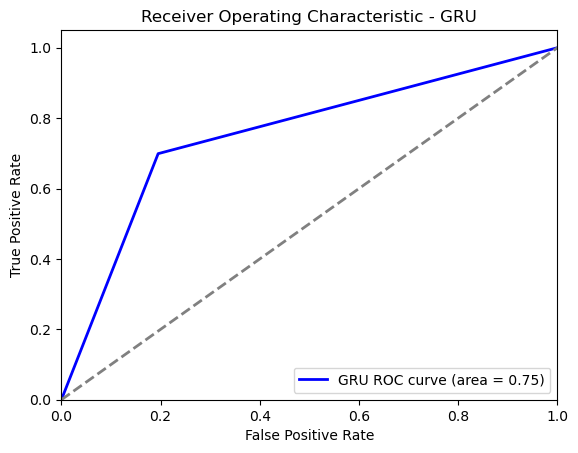

In [52]:
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve for lstm
gru_fpr, gru_tpr, gru_thresholds = roc_curve(y_test, gru_predictions)
gru_auc = auc(gru_fpr, gru_tpr)

# Plot ROC curve
plt.plot(gru_fpr, gru_tpr, color='blue', lw=2, label='GRU ROC curve (area = %0.2f)' % gru_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - GRU')
plt.legend(loc='lower right')
plt.show()

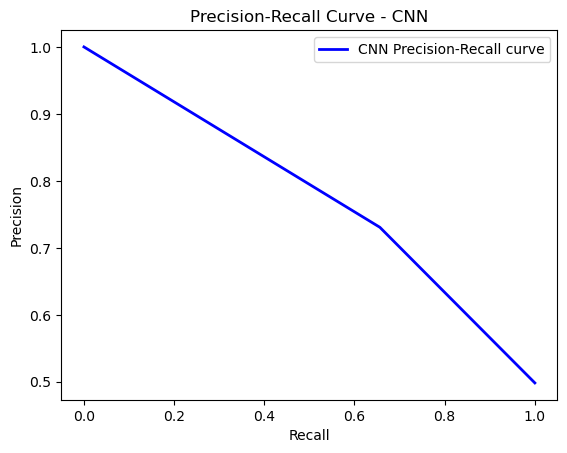

In [56]:
from sklearn.metrics import precision_recall_curve

# Calculate precision-recall curve for CNN
cnn_precision, cnn_recall, _ = precision_recall_curve(y_test, cnn_predictions)

# Plot precision-recall curve
plt.plot(cnn_recall, cnn_precision, color='blue', lw=2, label='CNN Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - CNN')
plt.legend(loc='best')
plt.show()

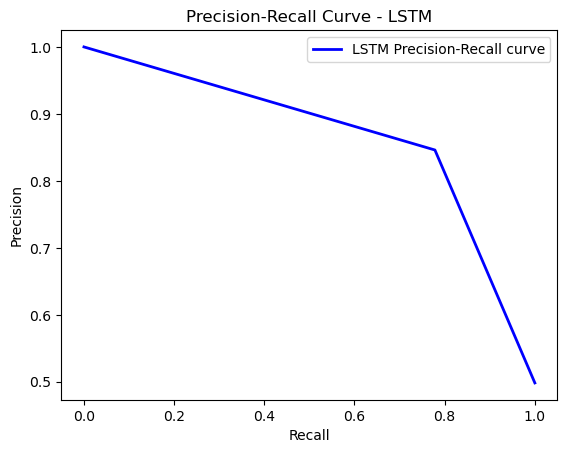

In [55]:
from sklearn.metrics import precision_recall_curve

# Calculate precision-recall curve for LSTM
lstm_precision, lstm_recall, _ = precision_recall_curve(y_test, lstm_predictions)

# Plot precision-recall curve
plt.plot(lstm_recall, lstm_precision, color='blue', lw=2, label='LSTM Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - LSTM')
plt.legend(loc='best')
plt.show()

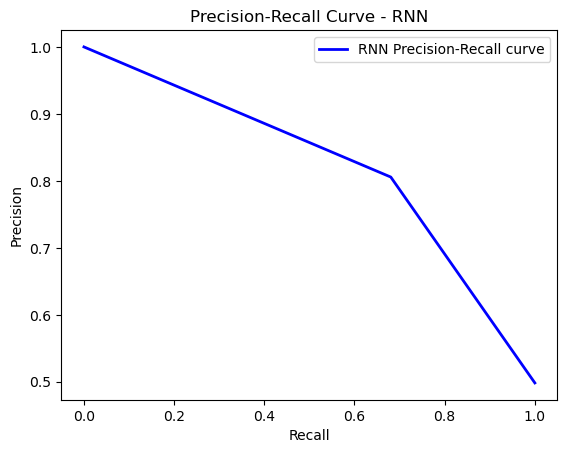

In [57]:
from sklearn.metrics import precision_recall_curve

# Calculate precision-recall curve for RNN
rnn_precision, rnn_recall, _ = precision_recall_curve(y_test, rnn_predictions)

# Plot precision-recall curve
plt.plot(rnn_recall, rnn_precision, color='blue', lw=2, label='RNN Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - RNN')
plt.legend(loc='best')
plt.show()

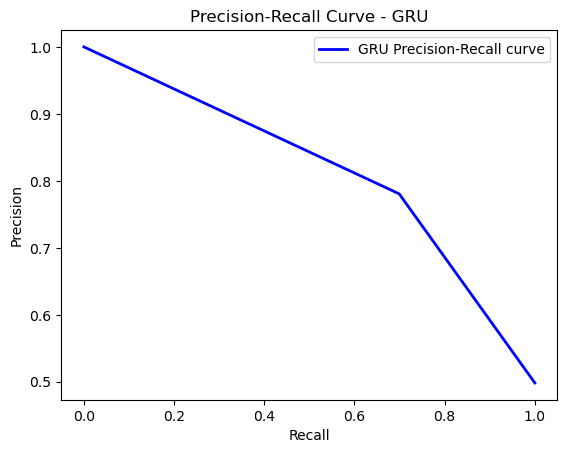

In [58]:
from sklearn.metrics import precision_recall_curve

# Calculate precision-recall curve for GRU
gru_precision, gru_recall, _ = precision_recall_curve(y_test, gru_predictions)

# Plot precision-recall curve
plt.plot(gru_recall, gru_precision, color='blue', lw=2, label='GRU Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - GRU')
plt.legend(loc='best')
plt.show()

5420/5420 [==============================] - 60s 10ms/step - loss: 0.5840 - accuracy: 0.6793


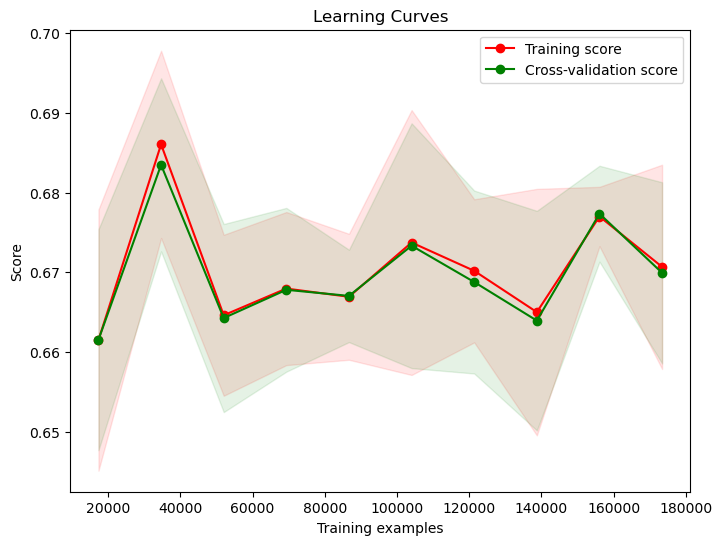

5420/5420 [==============================] - 127s 23ms/step - loss: 0.3564 - accuracy: 0.8066


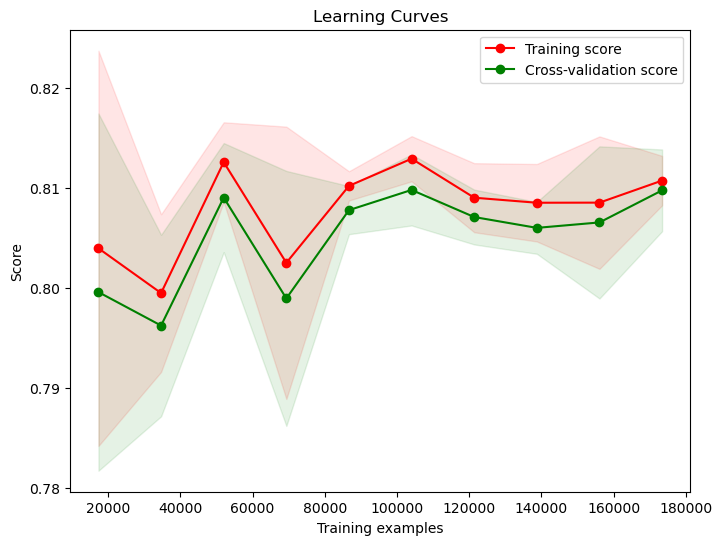

5420/5420 [==============================] - 43s 7ms/step - loss: 0.5660 - accuracy: 0.6948


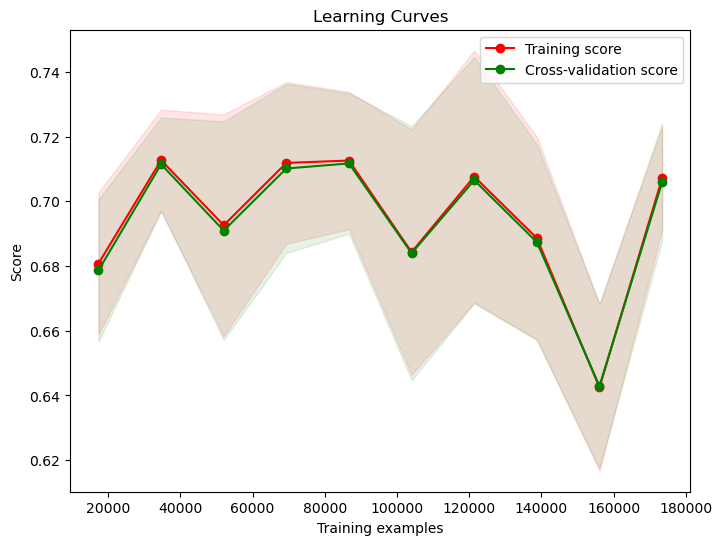

5420/5420 [==============================] - 272s 49ms/step - loss: 0.4894 - accuracy: 0.7294


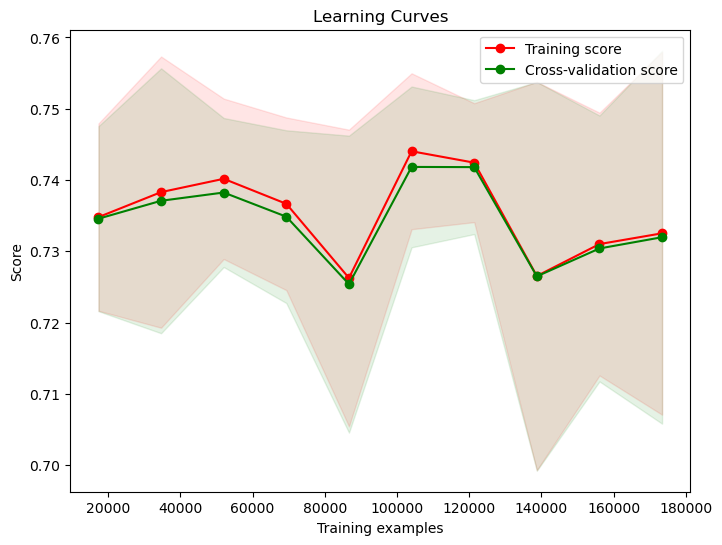

In [60]:
from sklearn.model_selection import learning_curve
from sklearn.base import BaseEstimator
import numpy as np
import matplotlib.pyplot as plt

class KerasClassifierWrapper(BaseEstimator):
    def __init__(self, model):
        self.model = model
        
    def fit(self, X, y):
        self.model.fit(X, y)
        return self
    
    def score(self, X, y):
        _, accuracy = self.model.evaluate(X, y, verbose=0)
        return accuracy

def plot_learning_curve(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(8, 6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.title("Learning Curves")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.show()

# Wrap your Keras models
cnn_model_wrapper = KerasClassifierWrapper(cnn_model)
lstm_model_wrapper = KerasClassifierWrapper(lstm_model)
rnn_model_wrapper = KerasClassifierWrapper(rnn_model)
gru_model_wrapper = KerasClassifierWrapper(gru_model)

# Plot learning curves for each model
plot_learning_curve(cnn_model_wrapper, X_train, y_train)
plot_learning_curve(lstm_model_wrapper, X_train, y_train)
plot_learning_curve(rnn_model_wrapper, X_train, y_train)
plot_learning_curve(gru_model_wrapper, X_train, y_train)
